# Stock Analysis

In [1]:
stock_ticker = "MARUTI"             #Change ticker name here and re-run the notebook
ema          = (30,60,200)          #Set periods for Exponentail Moving Average
focus_period = 1000                 #Filter period for focus. If set only last 150 trading days data will be shown for analysis.

**Installing Package**

In [2]:
# Install package
%pip install --upgrade portfoliotools

  Found existing installation: portfoliotools 1.0.7
    Uninstalling portfoliotools-1.0.7:
      Successfully uninstalled portfoliotools-1.0.7
  Running setup.py install for portfoliotools ... done
You should consider upgrading via the 'pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [3]:
from portfoliotools.screener.stock_detail import StockDetail
from portfoliotools.screener.stock_fundamentals import StockFundamentals
#from portfoliotools.screener.screener_pattern import CandleStickPatters
from portfoliotools.screener.utility.util import NumToStr, flatten_dicts_of_dicts, backTestStrategy, slope, get_arima_predictions
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from IPython.display import display_html
from pandas.plotting import register_matplotlib_converters
from plotly.subplots import make_subplots
import nsetools

import warnings
warnings.filterwarnings("ignore")
register_matplotlib_converters()
%matplotlib inline
sns.set()
pd.options.display.max_columns = None
pd.options.display.max_rows = None

nse = nsetools.Nse()
if not nse.is_valid_code(stock_ticker) and "NIFTY" not in stock_ticker:
    raise(Exception("Not a Valid Ticker"))
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

In [4]:
stockObj = StockDetail(stock_ticker, period = 2000)
stock_funda = StockFundamentals(stock_ticker)
details = stockObj.details()
details_funda = stock_funda.get_details_info()

ERROR:root:Error calculating ATR Results - MARUTI


### <font color = "red">Overview</font>

In [5]:
info = details['Overview']['Info']
info['Beta'] = details_funda.get('Beta (5Y monthly)')
df1 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['Overview'])
info = details['Overview']['52W Statistics']
df2 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['52W Stats'])
info = details['Overview']['Returns']
df3 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['Return Stats'])
info = details['Fundamental Analytics']
info['Trailing P/E'] = details_funda.get('Trailing P/E')
info['Forward P/E']  = details_funda.get('Forward P/E')
info['P/B']          = details_funda.get('Price/book')
info['PEG Ratio']    = details_funda.get('PEG Ratio (5 yr expected)')
info['Debt/Equity']  = details_funda.get('Total debt/equity')
info['ROA']          = details_funda.get('Return on assets')
info['ROE']          = details_funda.get('Return on equity')
df4 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['Fundamentals'])
info = flatten_dicts_of_dicts(details['Technical Analytics'])
df5 = pd.DataFrame( data = info.values(), index = np.array(list(info.keys())), columns = ['Technical Signals'])
cols = [col for col in df5.index.tolist() if 'Signal' in col or 'Portfolio' in col]
df5 = df5.loc[cols,:]
display_side_by_side(df1,df2,df3,df4,df5)

,Overview
Stock Name,MARUTI
Date,07Apr20
Last Close,4011.5
Last COB,03Apr20
Average Volume,670722.08
Standard Deviation,159.05
CAGR,7.12
Annual Volatility,27.98
Sharpe,0.129
Sortino,0.171


## <font color = 'red'>Fundamental Analysis</font>

### - Details 
    Balance sheet
    Cash Flow
    Key Statistics
    Income Statement

In [7]:
info = stock_funda.get_balance_sheet_info()
df1 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Balance Sheet'])
info = stock_funda.get_financial_info()
df2 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Financial Info'])
info = stock_funda.get_cash_flow_info()
df3 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Cash Flow Info'])
info = stock_funda.get_key_statistics()
df4 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Key Statistics'])
info = stock_funda.get_summary_statistics()
df5 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Summary Statistics'])
display_side_by_side(df1, df3, df4, df2, df5)

,Balance Sheet
Assets,nan
Current assets,nan
Cash,nan
Cash and cash equivalents,"1,859,000.0"
Other Short Term Investments,"50,617,000.0"
Total cash,"52,476,000.0"
Net receivables,"23,128,000.0"
Inventory,"33,226,000.0"
Other current assets,"4,868,000.0"
CurrAsset,"123,727,000.0"


## <font color = "red">Technical Analysis</font>

In [8]:
data = stockObj.generate_moving_averages(exponential=ema)
data = data.tail(focus_period) # last 150 periods

### - Close Price vs Volumne

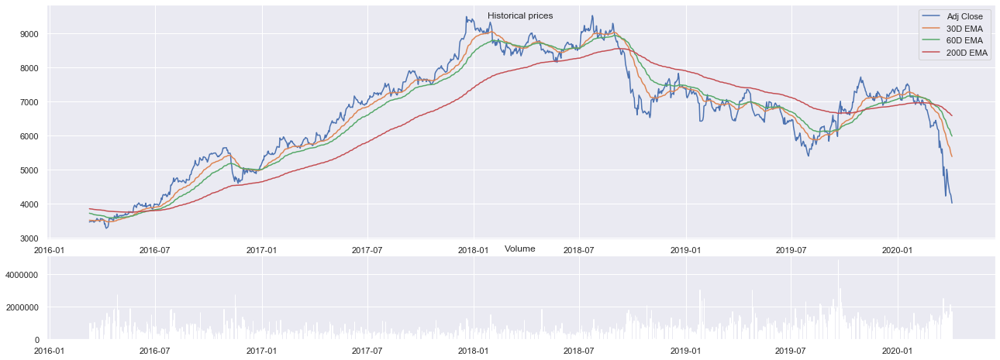

In [9]:
# Adjusted Close & Volumne - Historical
fig = plt.figure(figsize = (17,6))
fig.suptitle("Historical prices")

ax1 = fig.add_axes([0,.3,1,.7])
ax1.plot(data.index, data['Adj Close'], label = 'Adj Close')
ax1.legend()
for period in ema:
    col = '{0}D Exponential Moving Average'.format(period)
    label = '{0}D EMA'.format(period)
    ax1.plot( data.index, data[col], label = label)
    ax1.legend()

ax2 = fig.add_axes([0,0,1,.25])
ax2.set_title("Volume")
vol = data['Volume']#np.log10(data['Volume'])
#vol_cmap = data['Volume'].apply(lambda x, vol: 'rgb(250,0,0)' if x<vol else 'rgb(0,250,0)',vol = vol.mean())
ax2.bar(data.index, vol)
#ax2.set_ylim([vol.min()-.5, vol.max() + .5])
#ax2.plot(data.index, [vol.mean()]*len(vol), color = vol_cmap.tolist())
plt.show()

### Bollinger Bands

In [10]:
data = stockObj.get_bollinger_details().tail(focus_period)

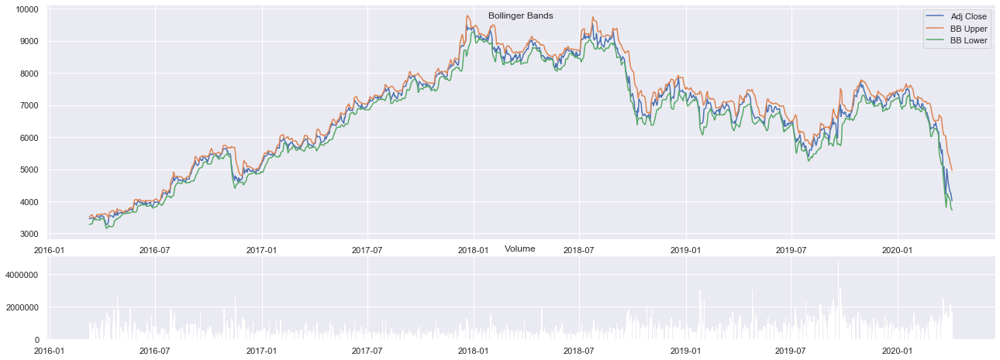

In [11]:
fig = plt.figure(figsize = (17,6))
fig.suptitle("Bollinger Bands")

ax1 = fig.add_axes([0,.3,1,.7])
ax1.plot(data.index, data['Adj Close'], label = 'Adj Close')
ax1.legend()
for part in ['Upper', 'Lower']:
    col = 'Bollinger Band {0}'.format(part)
    label = 'BB {0}'.format(part)
    ax1.plot( data.index, data[col], label = label)
    ax1.legend()

ax2 = fig.add_axes([0,0,1,.25])
ax2.set_title("Volume")
vol = data['Volume']
ax2.bar(data.index, vol)
plt.show()

### - Close Price Candle Stick

In [12]:
## Candle Stick - Historical
fig = go.Figure(data=[go.Candlestick(x=data.index,
                       open=data['Open'], high=data['High'],
                       low=data['Low'], close=data['Close'])])
#fig.layout.xaxis.type = 'category'
fig.show()

### - Williams R
**Description:** %D is 5 day smooth average of %R. Buy signal is triggered when %D is less than -75 and volume is more than 1.25 times avg 5 day volume. Sell signal is triggered when %D is more than -20 and volume is more than 1.25 times avg 5 day volume.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [13]:
#data = stockObj.get_williams_r_details()[2] # To get williams R data frame
fig = stockObj.plot_williams_r_details(period = focus_period)
fig.show()

### - MACD
**Descrption**: MACD is momentum indicator. MACD Line is EMA(12D) - EMA(26D). MACD Indicator is exponential moving average of MACD.
When MACD Line crosses MACD Indicator from top, it's a BUY zone. When MACD Line crosses MACD Indicator from below, it's a SELL zone. BUY signal is generated when BUY Zone creates a maxima based on 9 day period. SELL signal is generated when SELL Zone creates a maxima.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [14]:
fig = stockObj.plot_macd_details(period = focus_period)
fig.show()

### - RSI
**Descrption**: Relative Stregth Index(RSI) is momentum indicator. Relative Strength is calculated as ration of Average Gains to Average Loss. RS is then indexed to calculate RSI.

**Formula:** RS = Avg Gain/Avg Loss; 
RSI = 100 - 100/(1+RS)

Buy signal is given when RSI < 30.
Sell signal is given when RSI > 70.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [15]:
fig = stockObj.plot_rsi_details(period = focus_period)
fig.show()

### - OBV
**Description:** OBV is a momentum indicator. BUY signal is triggered when OBV Index is less than 0 and rate of OBV Index change is more than 60. SELL signal is triggered when OBV Index is more than 0 and rate of OBV Index change is more than 60.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [16]:
fig = stockObj.plot_obv_details(period = focus_period)
fig.show()

### ADX/ATR
**Description:**

**ADX Value  	        Trend Strength**

0-25	                Absent or Weak Trend

25-50	                Strong Trend

50-75	                Very Strong Trend

75-100	                Extremely Strong Trend


In [17]:
data = stockObj.get_adx_details()
data = data.join(stockObj.get_atr_details()['ATR'])
data.dropna(inplace = True)
data = data.tail(focus_period)

In [18]:
fig = make_subplots(rows = 3, cols = 1, shared_xaxes= True, vertical_spacing = 0.08, 
    column_widths = [15], row_heights = [2,2,2],
    specs=[[{"secondary_y": True}], [{"secondary_y": False}], [{"secondary_y": False}]])

hovertext      = ["<br>Close : " + "{:,}".format(np.round(txt['Close'],2)) + 
                    "<br>High: " + "{:,}".format(np.round(txt['High'],2)) + 
                    "<br>Low: " + "{:,}".format(np.round(txt['Low'],2)) + 
                    "<br>Volume: " + "{:,}".format(txt['Volume']) + 
                    "<br>ATR: " + "{:,}".format(np.round(txt['ATR'],2)) +
                    "<br>ADX: " + "{:,}".format(np.round(txt['ADX'],2))
                    for txt in data.to_dict(orient = "records")]
# Add Close Price
fig.add_trace(
go.Scatter(x=data.index, y=data['Close'], name="Close", text = hovertext, line = {'color':'purple'}), row = 2, col =1,
)
# Add ADX
fig.add_trace(
go.Scatter(x=data.index, y=data['ADX'], name="ADX", text = hovertext, line = {'color':'darkgray'}), row = 1, col =1,
)
# Add ATR
fig.add_trace(
go.Scatter(x=data.index, y=data['ATR'], name="ATR", text = hovertext, line = {'color':'black'}), row = 1, col =1,
secondary_y = True)                                                       
# Add Volume
fig.add_trace(
go.Scatter(x=data.index, y=data['Volume'], name="Volume", text = hovertext, line = {'color':'black'}), row = 3, col =1,
)
fig['layout']['yaxis1'].update(title='ADX')
fig['layout']['yaxis2'].update(title='ATR')
fig['layout']['yaxis3'].update(title='Close')
fig['layout']['yaxis4'].update(title='Volume')
fig.show()

### Combined Analysis

In [19]:
combined_analysis = stockObj.technical_details
combined_analysis.dropna()

Prices                                                       \
                   High          Low         Open        Close        Volume   
Date                                                                           
2014-11-05  3151.795319  3106.476657  3120.683105  3114.953125  2.671720e+05   
2014-11-07  3143.129251  3077.258640  3112.159240  3114.385010  3.028430e+05   
2014-11-10  3139.625202  3095.159063  3111.212304  3132.806152  2.072840e+05   
2014-11-11  3158.472299  3117.036823  3123.524527  3152.884521  2.133650e+05   
2014-11-12  3192.946825  3134.889756  3152.884592  3182.007812  2.610980e+05   
2014-11-13  3216.340117  3145.970792  3191.715605  3152.458496  2.359470e+05   
2014-11-21  3186.032865  3130.675116  3156.720272  3177.556396  2.614010e+05   
2014-11-24  3185.180438  3157.619836  3173.104957  3175.709473  1.565840e+05   
2014-11-25  3208.763175  3108.039362  3180.350278  3114.858643  3.438940e+05   
2014-11-26  3131.953802  3076.832823  3106.476994  3110.265381  2.233060e+05   
2014-11-27  3130.532901  3084.882893  3112.822241  3090.802246  2.443110e+05   
2014-11-28  3181.960119  3102.688187  3105.529477  3169.174316  2.756800e+05   
2014-12-01  3250.435476  3158.567107  3164.249687  3209.852295  5.104900e+05   
2014-12-02  3215.392625  3174.714877  3215.392625  3179.260986  1.657730e+05   
2014-12-03  3234.050720  3187.785190  3187.785190  3212.078125  2.867350e+05   
2014-12-04  3234.334956  3205.164334  3212.551734  3226.616211  1.992850e+05   
2014-12-05  3236.228966  3210.657358  3230.546386  3229.694092  1.400560e+05   
2014-12-08  3258.011951  3188.021613  3248.540986  3201.044189  2.033360e+05   
2014-12-09  3210.657174  3144.171046  3210.657174  3160.034912  2.215900e+05   
2014-12-10  3168.037699  3128.449020  3147.248977  3147.580322  2.361360e+05   
2014-12-11  3174.667743  3112.869691  3149.096135  3164.344482  1.563140e+05   
2014-12-12  3214.824457  3165.480865  3174.667655  3200.523438  2.415380e+05   
2014-12-15  3201.091528  3169.269223  3195.503751  3190.531494  1.352400e+05   
2014-12-16  3204.690749  3126.839454  3168.038156  3134.747803  2.171960e+05   
2014-12-17  3139.625111  3078.774157  3115.947697  3089.381592  2.670120e+05   
2014-12-18  3219.418006  3097.053175  3125.418671  3206.206055  2.832350e+05   
2014-12-19  3278.848475  3173.010428  3221.075581  3181.676270  4.735600e+05   
2014-12-22  3231.966757  3180.444801  3203.032913  3213.971924  1.949330e+05   
2014-12-23  3242.858807  3206.016842  3215.393006  3218.897217  2.020350e+05   
2014-12-24  3239.070378  3156.483601  3220.128446  3187.453613  4.030560e+05   
2014-12-26  3209.426007  3150.043100  3188.874058  3156.767578  2.108820e+05   
2014-12-29  3201.186642  3158.614694  3158.614694  3170.121826  2.112570e+05   
2014-12-30  3190.436719  3162.781546  3172.773461  3170.168945  1.095770e+05   
2014-12-31  3165.101819  3125.181793  3130.154050  3153.642090  2.816260e+05   
2015-01-01  3182.244303  3144.597217  3144.597217  3164.012695  2.992320e+05   
2015-01-02  3204.027690  3173.247051  3182.244469  3181.865723  2.339240e+05   
2015-01-05  3285.809636  3197.445478  3203.080657  3265.399658  5.367470e+05   
2015-01-06  3257.065114  3203.554157  3257.065114  3215.629639  4.227430e+05   
2015-01-07  3275.959504  3203.127873  3220.128209  3255.881104  3.692410e+05   
2015-01-08  3323.882963  3261.800734  3281.689763  3291.634277  4.220220e+05   
2015-01-09  3322.130776  3248.494013  3314.838178  3284.720459  1.940540e+05   
2015-01-12  3299.352938  3262.889719  3286.425162  3279.700684  1.528030e+05   
2015-01-13  3329.044589  3278.943271  3299.495221  3284.767822  2.377710e+05   
2015-01-14  3344.198148  3278.185561  3288.177476  3329.991699  4.290690e+05   
2015-01-15  3446.152963  3352.721975  3362.524518  3433.982910  6.706860e+05   
2015-01-16  3433.225050  3402.018264  3423.990858  3425.269531  3.790750e+05   
2015-01-19  3449.799255  3423.943472  3435.782179  3434.408936  1.925370e+05   
2015-01-20  3443.

## <font color = "red">Predictions </font>

### ARIMA

,MSE,SMAPE KUN,Pred Value,Pred Low 5%,Pred High 5%
0,22912.483,11.064,[4002.6],3801.5,4203.7


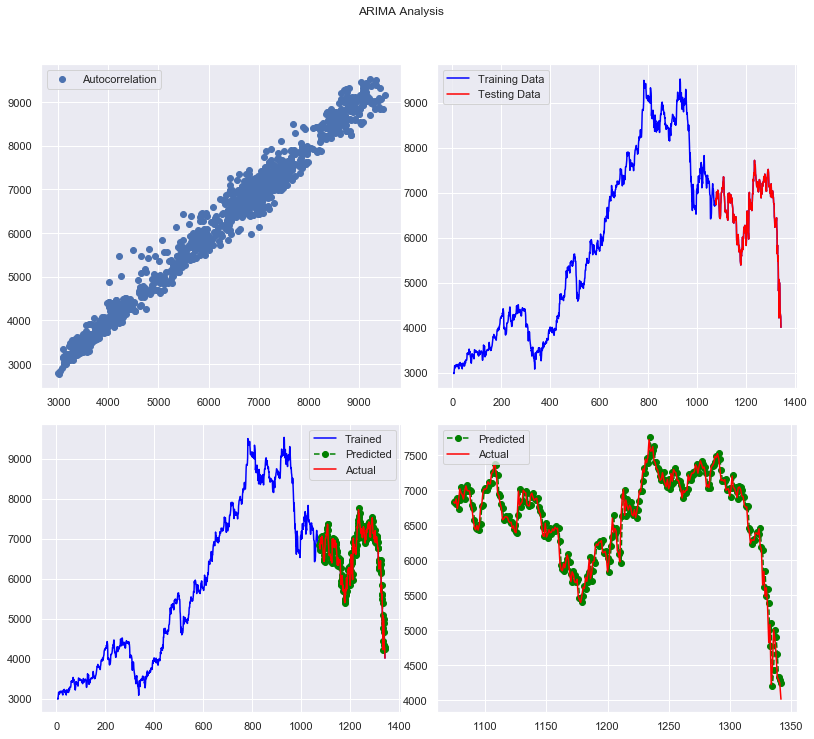

In [20]:
data = stockObj.historical_prices['Close'].values
result = get_arima_predictions(data, plot = True)
pd.DataFrame([result[0]])